In [58]:
# import required libraries and functions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report,\
    confusion_matrix

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFECV
from sklearn import metrics

In [4]:
# loading dataset
breast_cancer_df=pd.read_csv("/Users/myahaythar/Desktop/Data Science Dissertation /new testing/breasecancer_newdata.csv")
breast_cancer_df.head(7)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.1127,0.07400,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,NaN


In [5]:
#checking dataset information
breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [6]:
#dropping null values 
breast_cancer_df=breast_cancer_df.dropna(axis=1)
breast_cancer_df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [7]:
#counting null or empty values in each column after dropping null values
breast_cancer_df.isna().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [9]:
#Encoding categorical data values (
labelencoder_Y = LabelEncoder()
breast_cancer_df.iloc[:,1]= labelencoder_Y.fit_transform(breast_cancer_df.iloc[:,1].values)
print(labelencoder_Y.fit_transform(breast_cancer_df.iloc[:,1].values))

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 1
 0 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 1 1 0 1
 0 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0 1 0 1 1 1 1 0 0 1 1 0 0
 0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0
 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1
 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0
 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 0 1 

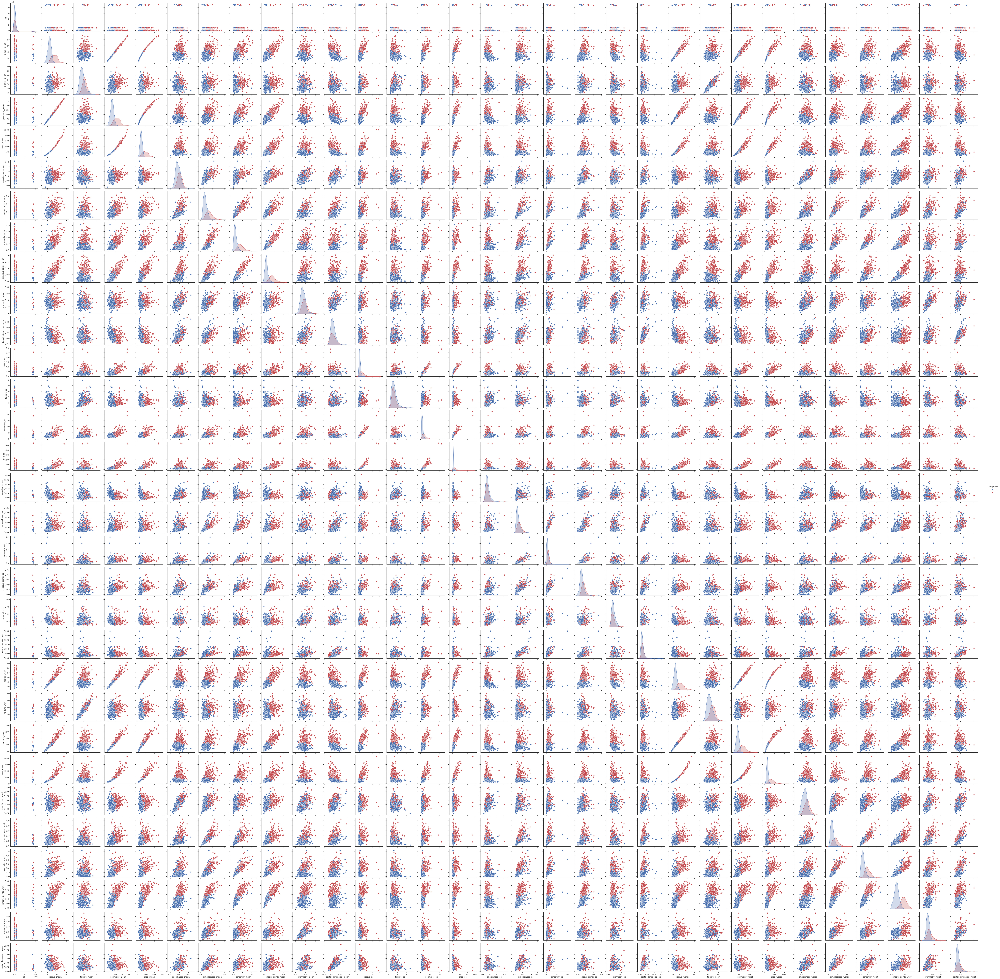

In [10]:
#Creating Pairplot
sns.set(style="ticks", color_codes=True)
sns.pairplot(breast_cancer_df, palette = ('b', 'r'), hue="diagnosis", plot_kws={"s": 50})
plt.show()

In [11]:
#Checking correlation
breast_cancer_df.corr()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.039769,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,...,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
diagnosis,0.039769,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.074626,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.044158,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661


<AxesSubplot:>

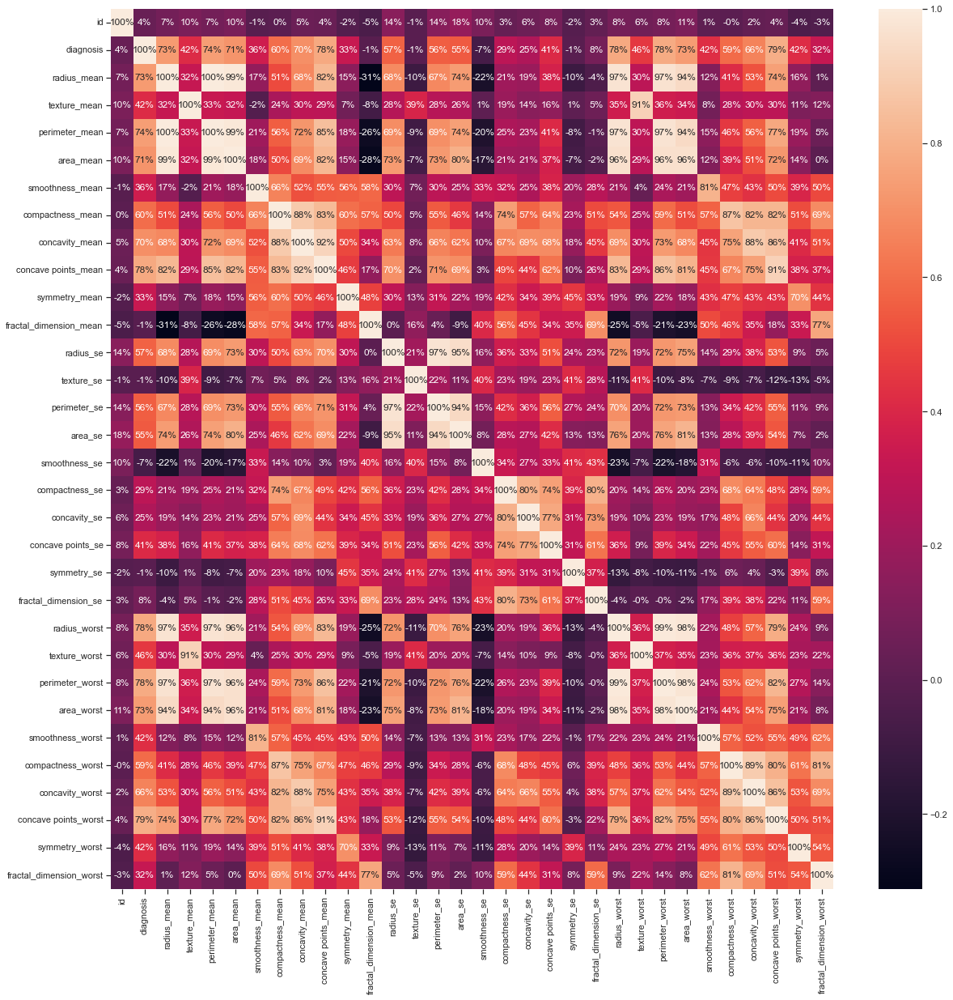

In [12]:
#heatmap for the correlation
plt.figure(figsize=(20,20))  
sns.heatmap(breast_cancer_df.corr(), annot=True, fmt='.0%')

In [14]:
#splitting data into predictors and target variables 
X = breast_cancer_df.iloc[:, 2:31].values 
Y = breast_cancer_df.iloc[:, 1].values 

In [15]:
#Performing feature scaling using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [126]:
#Splitting data into training and testing sets
X_train,X_test,Y_train,Y_test = train_test_split(X_scaled,Y,test_size=0.30,random_state = 42) 

In [127]:
#developing and training models
from sklearn.svm import SVC
#Creating function to train the models
def models(X_train,Y_train):
    #Logistic Regression 
    model1 = LogisticRegression(random_state = 0)
    model1.fit(X_train, Y_train)
    m1_score = model1.score(X_test, Y_test)
    
    #SVC linear
    model2 = SVC(kernel = 'linear', random_state = 0, probability=True)
    model2.fit(X_train, Y_train)
    m2_score = model2.score(X_test, Y_test)
    
    #DecisionTreeClassifier 
    model3 = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
    model3.fit(X_train, Y_train)
    m3_score = model3.score(X_test, Y_test)
    
    #multinomialNaiveBayes Classifier
    model4=MultinomialNB(alpha = 1.0, class_prior = None, fit_prior = True)
    model4.fit(X_train, Y_train)
    m4_score = model4.score(X_test, Y_test)
    scores = {
             "LR" : m1_score, 
             "SVM" : m2_score,
              "DT" : m3_score,
              "NB" : m4_score
    }
    prediction_models = [model1, model2, model3, model4]
    return prediction_models, scores

In [128]:
#calling function
all_model , all_scores = models(X_train,Y_train)

In [129]:
#building name and scores of the model in list
model_name = list(all_scores.keys())

model_scores = list(all_scores.values())

#checking score of the svc model
SVC_score = all_scores['SVM']
SVC_score = round(SVC_score*100,3)


98.83


In [130]:
LR, SVC, DT, NB = all_model
#creating predict function 
def predict(models):
    predictions = dict()
    n = 0
    
    
    for m in all_model:
        
        prediction={
            
               "y_pred_class" : m.predict(X_test),
               "y_pred_train" : m.predict(X_train),
               "pp"           : m.predict_proba(X_test)
            
            
                    }
        n += 1
    
        #predict probabilities for our testing target variable using our model
        predictions[f"model.{n}"] = prediction
    return predictions

In [178]:
predictions = predict(all_model)
confusion_matrix_hm = []
#model_name=predictions.keys()
#print('Testing Vs Training Score')
print(" -" * 30)
for model in predictions.keys():
    #predict probabilities for our testing target variable using our model
    y_pred_class , y_pred_train , pp = predictions[model].values()

    # checking accuracy
    
    #print('Test Accuracy score: ',  metrics.accuracy_score(Y_test, y_pred_class))
    #print('Train Accuracy score: ', metrics.accuracy_score(Y_train, y_pred_train))
    # checking precision
    #print('Test Precision score: ', metrics.precision_score(Y_test, y_pred_class))
    #print('Train Precision score: ', metrics.precision_score(Y_train, y_pred_train))
    # checking Recall (Sensitivity)
    #print('Test Recall (Sensitivity) score: ', metrics.recall_score(Y_test, y_pred_class))
    #print('Train Recall (Sensitivity) score: ', metrics.recall_score(Y_train, y_pred_train))
    # checking F1 score
    #print('Test F1 score: ', metrics.f1_score(Y_test, y_pred_class))
    #print('Train F1 score: ', metrics.f1_score(Y_train, y_pred_train))
    #print(".." * 30)


    #confusion matrix
    print()
    cm = confusion_matrix(Y_test,y_pred_class)
    confusion_matrix_hm.append(cm)
    print("Confusion Matrix :\n ", cm)
    print()
    #Entire Report of the Model
    print("Entire Report of the Model by Classification Report: \n", (classification_report(Y_test,y_pred_class)))
    print(" -" * 30)
    

 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

Confusion Matrix :
  [[108   0]
 [  4  59]]

Entire Report of the Model by Classification Report: 
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       108
           1       1.00      0.94      0.97        63

    accuracy                           0.98       171
   macro avg       0.98      0.97      0.97       171
weighted avg       0.98      0.98      0.98       171

 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

Confusion Matrix :
  [[108   0]
 [  2  61]]

Entire Report of the Model by Classification Report: 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       108
           1       1.00      0.97      0.98        63

    accuracy                           0.99       171
   macro avg       0.99      0.98      0.99       171
weighted avg       0.99      0.99      0.99       171

 - - - - - - - - - - -

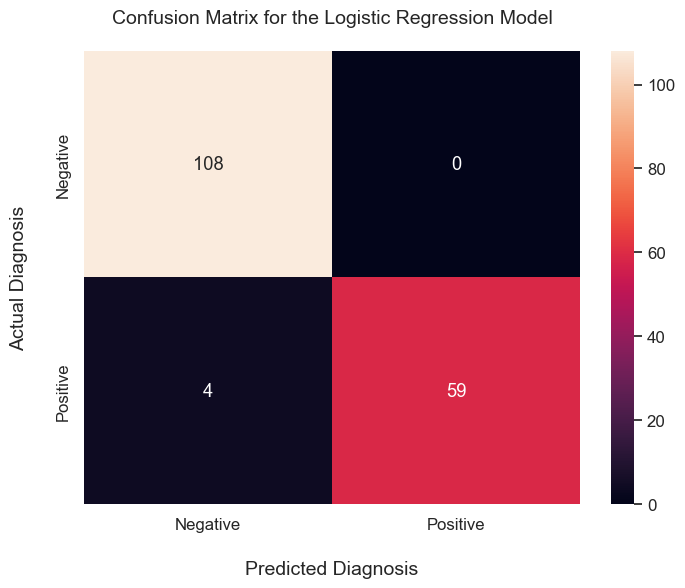

In [132]:
#heatmap of Logistic Regression

plt.figure(figsize=(8,6), dpi=100)
sns.set(font_scale = 1.1)
ax = sns.heatmap(confusion_matrix_hm[0], annot=True, fmt='d', )
ax.set_xlabel("Predicted Diagnosis", fontsize=14, labelpad=20)
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
# set y-axis label and ticks
ax.set_ylabel("Actual Diagnosis", fontsize=14, labelpad=20)
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
# set plot title
ax.set_title("Confusion Matrix for the Logistic Regression Model", fontsize=14, pad=20)

plt.show()

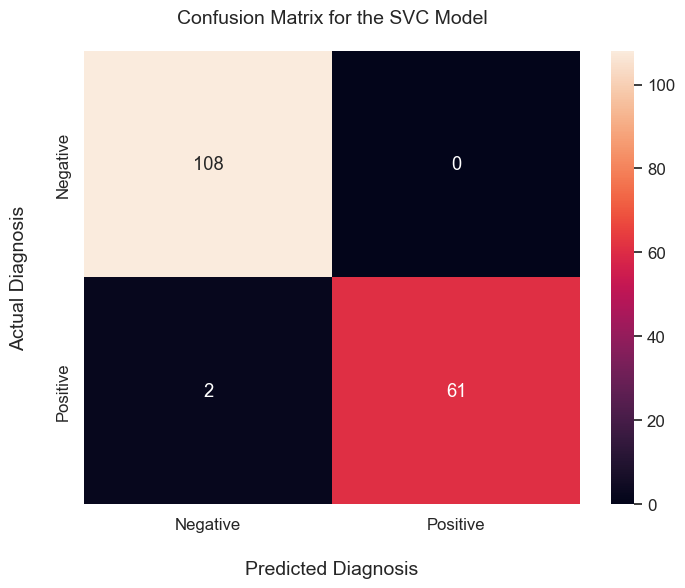

In [177]:
#heatmap of SVC

plt.figure(figsize=(8,6), dpi=100)
sns.set(font_scale = 1.1)
ax = sns.heatmap(confusion_matrix_hm[1], annot=True, fmt='d', )
ax.set_xlabel("Predicted Diagnosis", fontsize=14, labelpad=20)
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
# set y-axis label and ticks
ax.set_ylabel("Actual Diagnosis", fontsize=14, labelpad=20)
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
# set plot title
ax.set_title("Confusion Matrix for the SVC Model", fontsize=14, pad=20)

plt.show()

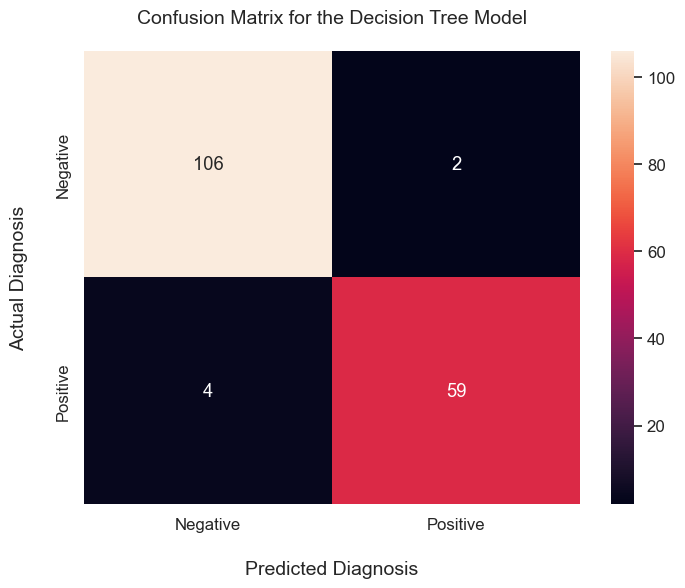

In [179]:
#heatmap of Decision Tree 

plt.figure(figsize=(8,6), dpi=100)
sns.set(font_scale = 1.1)
ax = sns.heatmap(confusion_matrix_hm[2], annot=True, fmt='d', )
ax.set_xlabel("Predicted Diagnosis", fontsize=14, labelpad=20)
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
# set y-axis label and ticks
ax.set_ylabel("Actual Diagnosis", fontsize=14, labelpad=20)
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
# set plot title
ax.set_title("Confusion Matrix for the Decision Tree Model", fontsize=14, pad=20)

plt.show()

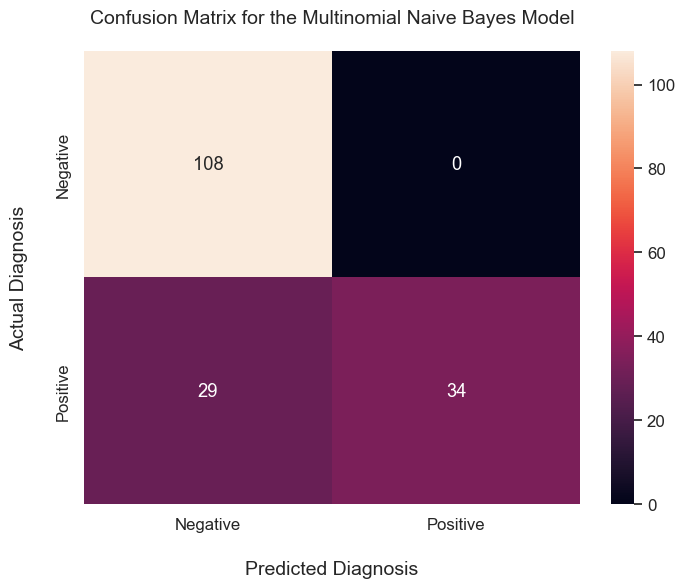

In [180]:
#heatmap of Multinomial Naive Bayes

plt.figure(figsize=(8,6), dpi=100)
sns.set(font_scale = 1.1)
ax = sns.heatmap(confusion_matrix_hm[3], annot=True, fmt='d', )
ax.set_xlabel("Predicted Diagnosis", fontsize
              =14, labelpad=20)
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
# set y-axis label and ticks
ax.set_ylabel("Actual Diagnosis", fontsize=14, labelpad=20)
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
# set plot title
ax.set_title("Confusion Matrix for the Multinomial Naive Bayes Model", fontsize=14, pad=20)

plt.show()

In [133]:
model_name = list(all_scores.keys())
model_name

['LR', 'SVM', 'DT', 'NB']

In [134]:
percentage_all_scores = [round(i * 100, 2) for i in all_scores.values()]
percentage_all_scores


[97.66, 98.83, 96.49, 83.04]

Text(0, 0.5, 'Percentage(%)')

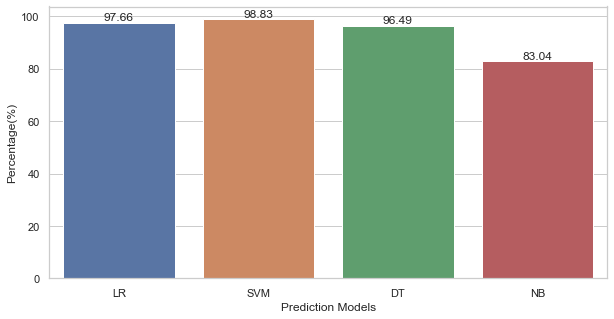

In [135]:
sns.set(style = 'whitegrid')
 
ax = sns.barplot (x = model_name ,y = percentage_all_scores )
for i in ax.containers:
    ax.bar_label(i) #ax.text(_, _, tip )
ax.set_xlabel('Prediction Models')
ax.set_ylabel('Percentage(%)')






In [136]:
#implementing RFECV feature selection method 
from sklearn.svm import SVC
model_rfe = SVC(kernel = 'linear', random_state = 1, probability=True)
rfecv = RFECV(model_rfe, cv = 5, scoring='accuracy')
rfecv = rfecv.fit(X_train,Y_train)
Y_pred_rfecv = rfecv.predict(X_test)
#calculating accuracy by rfecv
accuracy_rfecv = round(accuracy_score(Y_test,Y_pred_rfe)*100,3)

print("Accuracy_Score: ", accuracy_rfe,"%")
print()

Accuracy_Score:  98.246 %



Accuracy_Score:  98.246 %


AttributeError: 'RFECV' object has no attribute 'grid_scores'

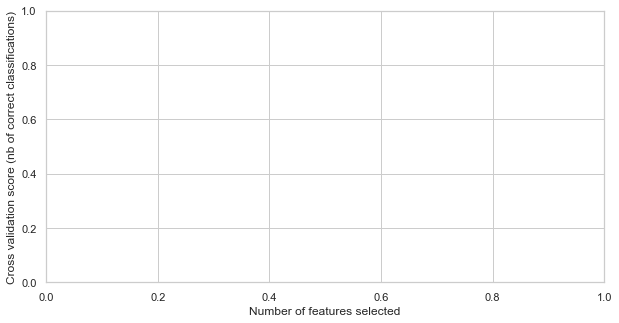

In [143]:
#implementing RFECV feature selection method 

# initialize the RFECV object
model_rfe = SVC (kernel= 'linear', random_state = 0)
rfecv = RFECV(model_rfe,  cv = 5,scoring='accuracy')

# fit the RFECV object to the training data
rfecv = rfecv.fit(X_train, Y_train)

# make predictions on the test data
y_pred_rfecv = rfecv.predict(X_test)


# Calculate the accuracy of the predictions
accuracy_rfecv = accuracy_score(Y_test, Y_pred_rfecv)
accuracy_rfecv = round(accuracy_rfecv *100,3)
print("Accuracy_Score: ",accuracy_rfecv ,"%")
import matplotlib.pyplot as plt

# Plot the mean cross-validation scores and the number of features selected at each step
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores) + 1), rfecv.grid_scores)
plt.show()




In [144]:
accuracy_rfecv

98.246

In [ ]:

confusion_matrix_rfecv = confusion_matrix(Y_test,Y_pred_rfe_cv)
print("Confusion Matrix :\n ",confusion_matrix_rfecv)
print()
# Accuracy,F1_Score, Precision_Score,Recall_Score
print("Accuracy_Score: ", accuracy_rfe_cv,"%")
print()
print("F1 Score: ", (f1_score(Y_test,Y_pred_rfe_cv)))
print("Precision Score: ", (precision_score(Y_test,Y_pred_rfe_cv)))
print("Recall Score :", (recall_score(Y_test,Y_pred_rfe_cv)))
print("\n")
#Entire Report of the Model
print("Entire Report of the Model: \n", (classification_report(Y_test,Y_pred_rfe_cv)))

In [113]:
model_ffs = SVC(kernel='linear')
# Build forward feature selection
ffs = SFS(model_ffs,
           k_features= 'best',
           forward=True,
           floating=False,
           verbose=2,
           scoring='accuracy',
           cv=5)

# Perform forward feature selection
ffs = ffs.fit(X_train, Y_train)
# Selected Features list
feat_cols_ffs = list(ffs.k_feature_idx_)
#fitting full model with selected features
model_ffs.fit(X_train[:,feat_cols_ffs], Y_train)




[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.7s finished

[2023-01-11 01:18:52] Features: 1/29 -- score: 0.9095886075949366[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    0.5s finished

[2023-01-11 01:18:53] Features: 2/29 -- score: 0.9347151898734177[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    0.5s finished

[2023-01-11 01:18:53] Features: 3/29 -- score: 0.9548417721518987[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

SVC(kernel='linear')

In [116]:
#predicting with selected features for training data
y_train_pred_ffs = model_ffs.predict(X_train[:, feat_cols_ffs])
#predicting with selected features for testing data
y_test_pred_ffs = model_ffs.predict(X_test[:, feat_cols_ffs])
print(y_train_pred_ffs)
print(y_test_pred_ffs)
print(Y_test)
#calculating accuracy for training data
accuracy_train_ffs = accuracy_score(Y_train, y_train_pred_ffs)
#calculating accuracy for testing data
accuracy_train_ffs = round(accuracy_train_ffs*100,3)
print("Training_Accuracy_Score: ",accuracy_train_ffs ,"%")

accuracy_ffs = accuracy_score(Y_test, y_test_pred_ffs)
accuracy_ffs = round(accuracy_ffs*100,3)
print("Accuracy_Score: ",accuracy_ffs ,"%")

[1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 0
 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0
 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 0
 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1
 1 0 1 0 1 0 0 0 0 1 1 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 1 1 1 0 0 1 0 0
 0 0 0 0 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0
 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1
 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 0 0 0
 1 1 0 0 0 1 1 1 0 0 1 0 1 0 1 0 0 1 0 1 1 1 1 0 0 0 0 0]
[1 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1
 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1
 0 0 1 0 0 1 1 0 0 1 0 1 0 1 1 0 0 1 1 0 1

In [159]:
from sklearn.svm import SVC
model_bfs = SVC(kernel='linear')
# Build step forward feature selection
bfs = SFS(model_bfs,
           k_features= 'best',
           forward = False,
           floating=False,
           verbose=1,
           scoring='accuracy',
           cv=5)

# Perform SFFS
bfs = bfs.fit(X_train, Y_train)
# Which features?
feat_cols_bfs = list(bfs.k_feature_idx_)

model_bfs.fit(X_train[:,feat_cols_bfs], Y_train)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.5s finished
Features: 28/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    0.5s finished
Features: 27/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    0.5s finished
Features: 26/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    0.5s finished
Features: 25/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.4s finished
Features: 24/1[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.4s finished
Features: 23/1[Parallel(

SVC(kernel='linear')

In [160]:
#training model with selected features
y_train_pred_bfs = model_bfs.predict(X_train[:, feat_cols_bfs])

#calculating training accuracy
accuracy_train_bfs = accuracy_score(Y_train, y_train_pred_bfs)
accuracy_train_bfs = round(accuracy_train_bfs*100,3)
print("Training_Accuracy_Score: ",accuracy_train_bfs ,"%")

#testing model with selected features
y_test_pred_bfs = model_bfs.predict(X_test[:, feat_cols_bfs])
#calculating testing accuracy
accuracy_bfs = accuracy_score(Y_test, y_test_pred_bfs)
accuracy_bfs = round(accuracy_bfs*100,3)
print("Accuracy_Score: ",accuracy_bfs ,"%")
print(y_test_pred_bfs)
print(Y_test)

Training_Accuracy_Score:  97.99 %
Accuracy_Score:  98.246 %
[0 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 1
 0 0 0 0 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1
 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0]
[0 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 1
 0 0 0 1 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1
 1 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0]


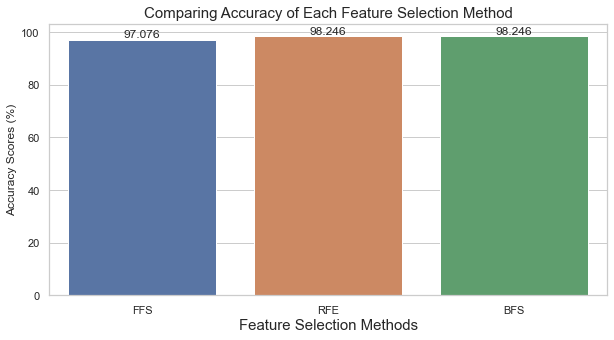

In [161]:
import matplotlib.pyplot as plt
sns.set(style = 'whitegrid')
# Create a list of the methods
methods = ['FFS', 'RFE', 'BFS']

# Create a list of the accuracies
accuracies = [accuracy_ffs, accuracy_rfecv, accuracy_bfs]
sns.set(style = 'whitegrid')
 
ax = sns.barplot (x = methods ,y = accuracies )
for i in ax.containers:
    ax.bar_label(i) 
# Show the plot
plt.title("Comparing Accuracy of Each Feature Selection Method", fontsize = 15)
plt.xlabel('Feature Selection Methods', fontsize = 15 )
plt.ylabel('Accuracy Scores (%)')
plt.xticks()
plt.yticks()
plt.rcParams["figure.figsize"] = (10,5)

(array([  0.,  20.,  40.,  60.,  80., 100., 120.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

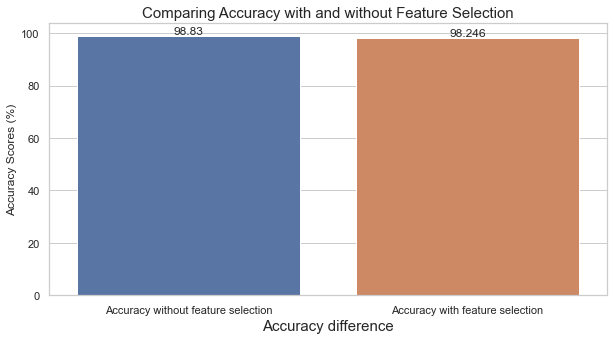

In [176]:


# Set the style of the plot
sns.set(style = 'whitegrid')

# Create a list of the methods
Difference = ['Accuracy without feature selection', 'Accuracy with feature selection']

# Create a list of the accuracies
accuracy_scores = [SVC_score, accuracy_rfecv]

# Create the bar plot
ax = sns.barplot(x=Difference, y = accuracy_scores)

# Add labels to the bars
for i in ax.containers:
    ax.bar_label(i)



# Show the plot
plt.title("Comparing Accuracy with and without Feature Selection", fontsize = 15)
plt.xlabel('Accuracy difference', fontsize = 15 )
plt.ylabel('Accuracy Scores (%)')
plt.xticks()
plt.yticks()





In [166]:
#checking and comparing actual and predicted values
print(y_pred_rfecv)
print(Y_test)

[0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 1
 0 0 0 0 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1
 1 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0]
[0 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 1
 0 0 0 1 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1
 1 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0]


In [170]:
prediction_compare = ["Prediction", "Actual",
                     "Prediction", "Actual"]
result = [ list(Y_test).count(0),list(y_pred_rfecv).count(0),
          list(Y_test).count(1) , list(y_pred_rfecv).count(1)]
comparison = ["Begnin", "Begnin",
              "Malignant", "Malignant"
             ]
result_df = pd.DataFrame(
                     { "Prediction" : prediction_compare,
                      "Result"    : result,
                      "Comparison"  : comparison

}

)
result_df


,Prediction,Result,Comparison
0,Prediction,108,Begnin
1,Actual,109,Begnin
2,Prediction,63,Malignant
3,Actual,62,Malignant


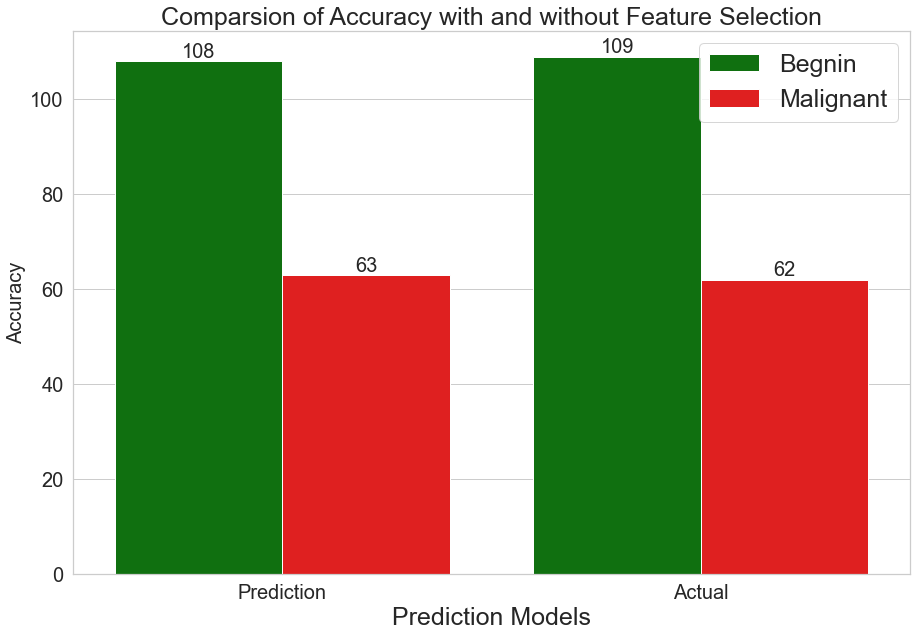

In [173]:
sns.set(style = 'whitegrid')
 
ax = sns.barplot (x = "Prediction" ,y = "Result", hue="Comparison", data= result_df, palette = ["green", "red"])
for i in ax.containers:
    ax.bar_label(i, fontsize = 20) 

    
plt.title("Comparsion of Accuracy with and without Feature Selection", fontsize = 25)
plt.xlabel("Prediction Models", fontsize = 25 )
plt.ylabel("Accuracy", fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.legend (fontsize = 25)
plt.rcParams["figure.figsize"] = (15,10)
plt.savefig("prediction_difference.png", dpi = 150)